# LiDAR Point cloud data and machine learning
This notebook takes you through the use of LiDAR data in testing machine learning models for prediction of urban structures in Copenhagen, Denmark.

In [1]:
"""
@Author: Peter Kongstad
Script to load laz/las files that been downloaded from Dataforsyningen (https://dataforsyningen.dk/data/3931) and then added RGB
data through QGIS and LAStools. The script tests several methods of machine learning and looks at methods to increase model 
accuracy when facing new data
"""
import warnings
warnings.filterwarnings('ignore') # Ignore decrepitation warnings (Never use this for first time run throughs)
import os
import pandas as pd
import laspy
import numpy as np
import matplotlib.pyplot as plt
import pickle

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from IPython.display import Image

In [2]:
###########
## Flags ##
###########

save_model  = 0 ## Save a new model
load_model  = 1 ## Load an existing model

data_folder = "../../Lidar/ML"

### Choose what classes to use for the current model
The LiDAR data come with classification labels for a variety of urban structures. Depending on the tile acquired, there may be many categories or few. For the tiles I have used in this example they all contain the same classes which are seen below. The classes Unclassified, high/low points (noise) and reserved contains very few data points and do not serve any purpose in this exercise and are therefore omitted. Water is only present in a few data points and most of the real water zones. such as harbor channels, do not contain data. Therefore it is not added to the model either. Through extensive testing, which I will deliberate on further down, I have chosen to exclude low vegetation and bridge deck as well.

In [3]:
## Setting up target names for classification
target_names_all=[
 #   'Unclassified',       #1
    'Ground',              #2
 #  'Low Vegetation',      #3
    'Medium Vegetation',   #4
    'High Vegetation',     #5
    'Buildings',           #6
 #   'Low Point(Noise)',   #7
 #   'Reserved',           #8
 #   'Water',              #9
 #   'Bridge Deck',        #17
 #   'High Noise',         #18
    ]

target_names_dict = {
    'Unclassified'        : 1,
    'Ground'              : 2,
    'Low Vegetation'      : 3,
    'Medium Vegetation'   : 4,
    'High Vegetation'     : 5,
    'Buildings'           : 6,
    'Low Point(Noise)'    : 7,
    'Reserved'            : 8,
    'Water'               : 9,
    'Bridge Deck'         : 17,
    'High Noise'          : 18,
    }

classi_filt = []
for items in target_names_all:
    classi_filt.append(target_names_dict[items]) 
print('Selected classes for this run: ', target_names_all)
print('Selected classes by numbers', classi_filt) 

## Setting up file for saving the point cloud feature selection and preparation
dmodel = (data_folder+f'/saved_models/clf_model_{len(classi_filt)}_targets.sav')
print('Model file name and directory: ', dmodel)

Selected classes for this run:  ['Ground', 'Medium Vegetation', 'High Vegetation', 'Buildings']
Selected classes by numbers [2, 4, 5, 6]
Model file name and directory:  ../../Lidar/ML/saved_models/clf_model_4_targets.sav


### LiDAR data load into pandas dataframe

In [4]:
filename   = (data_folder+'/data/6172_723_SVKBH_color_jakted.laz')
las        = laspy.read(filename)

point_data = np.stack([las.X, las.Y, las.Z, las.red, las.green, las.blue, las.intensity, las.classification, las.number_of_returns, las.omnivariance, las.planarity, las.verticality], axis=0).transpose(1,0)
df         = pd.DataFrame(point_data, columns = ['X','Y','Z', 'R', 'G', 'B', 'Intensity', 'Classification', 'NumberOfReturns', 'Omnivariance', 'Planarity', 'Verticality'])

## Filter out data based on classifications that we dont want
df         = df[df["Classification"].isin(classi_filt)]
pcd        = df

pcd.dropna(inplace=True)

### Visualizing the loaded data
Below is a QGIS 3D image of the LiDAR data with RGB colors applied, followed by a second image showing all the pre-labeled classification included in the original data. The loaded input data is visualize further below in 2D

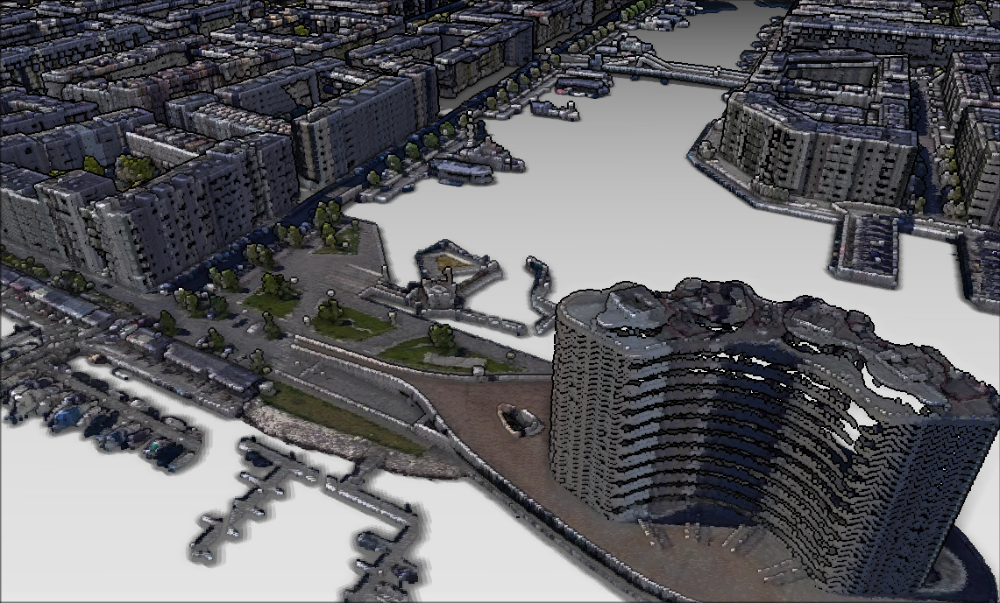

In [5]:
Image(filename = "../../QGIS/images/3d_render_training_set.png", width=800, height=500)

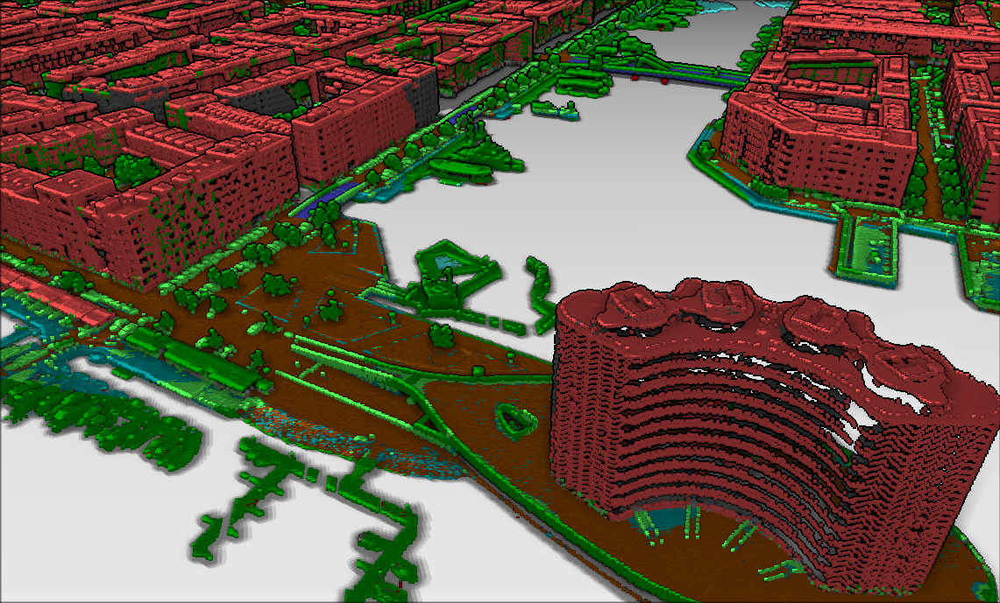

In [6]:
Image(filename = "../../QGIS/images/3d_classification_training_set.png", width=800, height=500)

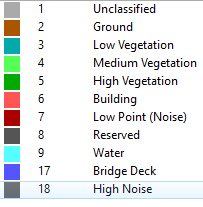

In [7]:
Image(filename = "../../QGIS/images/legend.png", width=200, height=300)

*An early observation to the above image - It is already seen here how low walls, the local harbor-bath, surrounding boat piers, house boats, bridge railings and structures across from the peninsular "highrise" are labelled as low, medium and high vegetation along with actual vegetation. Through thorough data analysis in QGIS and iterations of ML results presenting consistently low scores and bad predictive results on validation data, low vegetation labels have been removed in this iteration*

Text(0.5, 1.0, 'Verticality')

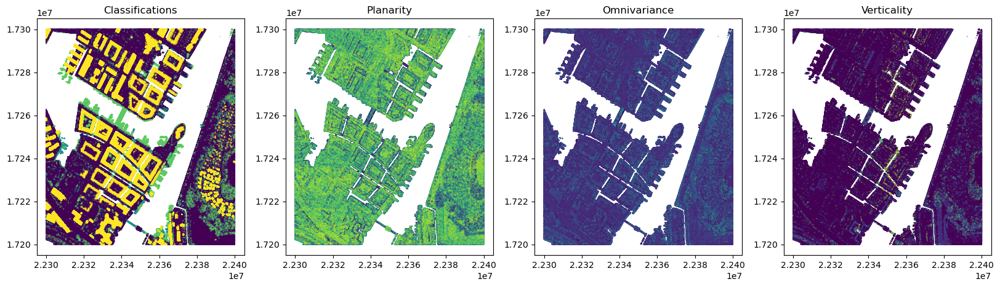

In [8]:
## Visualize classification and 3 computed parameters
fig, axs = plt.subplots(1, 4, figsize = (20,5))
axs[0].scatter(pcd['X'], pcd['Y'], c = pcd['Classification'], s=0.05)
axs[0].set_title('Classifications')
axs[1].scatter(pcd['X'], pcd['Y'], c = pcd['Planarity'],      s=0.05)
axs[1].set_title('Planarity')
axs[2].scatter(pcd['X'], pcd['Y'], c = pcd['Omnivariance'],   s=0.05)
axs[2].set_title('Omnivariance')
axs[3].scatter(pcd['X'], pcd['Y'], c = pcd['Verticality'],    s=0.05)
axs[3].set_title('Verticality')

### Setting up labels, features and training
Features are the input variables to the model and ideally one uses only the most relevant ones to avoid cluttering the model with noise. Initially the X,Y,Z point cloud data and the attached R,G,B values are selected. Later in this process Planarity, Omnivariance and Verticality is added, as seen in the plots above.
The main classifier used for this project is the random forest method, but K-nearest neighbor is also test. 
For training the model, the labels and features are being split in a train/test batch of 50/50 %. Initially the ratio was 60/40% which resulted in overfitting of the training data. 

In [9]:
labels          = pcd['Classification']
features        = pcd[['X','Y','Z','R','G','B']]
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.5) ## Training with less data

In [10]:
## Creating the classifications below is computational heavy and takes a while
## Therefore the model can be saved as a pickle and later loaded for multiple runs

if save_model:
    from sklearn.feature_selection import SelectFromModel
    from sklearn.svm import LinearSVC
    from sklearn.pipeline import Pipeline

    clf = Pipeline([
        ('feature_selection', SelectFromModel(LinearSVC(C=0.01, penalty="l1", dual=False))),
        ('classification', RandomForestClassifier())
        ])
    clf.fit(X_train, y_train)
    print('Model saved as: ', dmodel)
    pickle.dump(clf, open(dmodel, 'wb'))
    print('File size: ',round((os.stat(dmodel).st_size)/(10**9),2), 'gb')

In [11]:
## If the model has already been run and saved, it can be loaded here much faster

if load_model:
    print('Loading saved model: ', dmodel)
    clf = pickle.load(open(dmodel, 'rb'))

Loading saved model:  ../../Lidar/ML/saved_models/clf_model_4_targets.sav


### Random Forest Classification
The random forest classifier fits several decision tree classifiers on various sub-samples of the features and uses averaging to increase the accuracy of the prediction and limits overfitting.

In [12]:
rf_classifier  = RandomForestClassifier(n_estimators = 10)
rf_classifier.fit(X_train, y_train)
rf_predictions = rf_classifier.predict(X_test)

print(classification_report(y_test, rf_predictions, target_names=target_names_all))

                   precision    recall  f1-score   support

           Ground       0.99      1.00      0.99   2465470
Medium Vegetation       0.92      0.84      0.88    255235
  High Vegetation       0.96      0.94      0.95    493975
        Buildings       0.98      0.98      0.98    925401

         accuracy                           0.98   4140081
        macro avg       0.96      0.94      0.95   4140081
     weighted avg       0.98      0.98      0.98   4140081



### Classifier performance and metrics 
The metrics for the random forest are seen above and generally illustrate a very good accuracy for this run. Medium vegetation performs the poorest.

**Accuracy** is a general measure on all observations about the classifiers performance to predict labels correctly.

**Precision** Is the ability of the classifier not to label as positive a sample that is negative - Is the model precise?

**Recall** is the ability of the classifier to find all of the positive samples - Does it find all objects per class or globally?

**F1 score** Weighted harmonic mean of the precision and recall - How well does the classifier averagely perform?

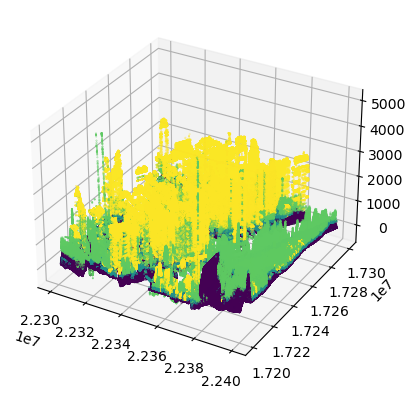

In [13]:
## 3D visualisation of the random forest prediction
ax = plt.axes(projection='3d')
ax.scatter(X_test['X'], X_test['Y'], X_test['Z'], c = rf_predictions, s=0.1)
plt.show()

Text(0.5, 1.0, 'Differences')

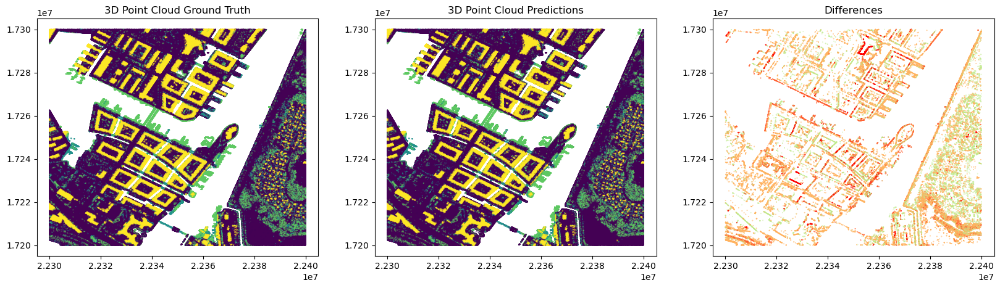

In [14]:
fig, axs = plt.subplots(1, 3, figsize = (20,5))
axs[0].scatter(X_test['X'], X_test['Y'], c = y_test,         s = 0.05)
axs[0].set_title('3D Point Cloud Ground Truth')
axs[1].scatter(X_test['X'], X_test['Y'], c = rf_predictions, s = 0.05)
axs[1].set_title('3D Point Cloud Predictions')
axs[2].scatter(X_test['X'], X_test['Y'], c = y_test-rf_predictions, cmap = plt.cm.rainbow, s = 0.05*(y_test-rf_predictions))
axs[2].set_title('Differences')

### RF Results
First picture on the left shows the ground truth from the labeled data. Since we have a global high accuracy on the model, the predictions line up quite well. It is generally the low vegetation that is causing problems which can be seen in the differences plot on the right. The decent precision and low recall indicates that it struggles with predicting the correct samples.

### K-Nearest neighbors classification
For the sake of testing different methods, the KNN classifier is tested below. The KNN uses proximity to make predictions about an individual data point grouping. 

In [15]:
## Testing on K-Nearest neighbors
from sklearn.neighbors import KNeighborsClassifier
knn_classifier  = KNeighborsClassifier()
knn_classifier.fit(X_train, y_train)
knn_predictions = knn_classifier.predict(X_test)
print(classification_report(y_test, knn_predictions, target_names = target_names_all))

                   precision    recall  f1-score   support

           Ground       0.87      0.94      0.90   2465470
Medium Vegetation       0.45      0.24      0.31    255235
  High Vegetation       0.74      0.63      0.68    493975
        Buildings       0.95      0.95      0.95    925401

         accuracy                           0.86   4140081
        macro avg       0.75      0.69      0.71   4140081
     weighted avg       0.85      0.86      0.85   4140081



Text(0.5, 1.0, 'Differences')

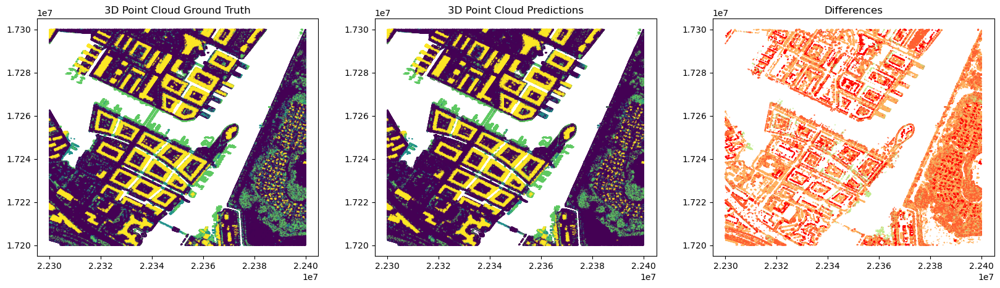

In [16]:
fig, axs = plt.subplots(1, 3, figsize = (20,5))
axs[0].scatter(X_test['X'], X_test['Y'], c = y_test,          s = 0.05)
axs[0].set_title('3D Point Cloud Ground Truth')
axs[1].scatter(X_test['X'], X_test['Y'], c = knn_predictions, s = 0.05)
axs[1].set_title('3D Point Cloud Predictions')
axs[2].scatter(X_test['X'], X_test['Y'], c = y_test-knn_predictions, cmap = plt.cm.rainbow, s = 0.05*(y_test-knn_predictions))
axs[2].set_title('Differences')

### KNN Results
The KNN classifier performs worse than the Random forest. Generally data labelled buildings and ground performs excellent. But vegetation prediction is again a struggle. The KNN method is more vulnerable to local noise in the current vector space, which could be the issue here. Through analysis in QGIS it is clear that a wide array of data point that should not have been labelled as vegetation, was labelled as such. The consequence of this noise becomes more evident in the KNN result. 

## Testing the capabilities of the RF model on new data
In order to test the ML efficiency on unseen data, the model will be tested on a new dataset from a differnet part of Copenhagen. This area features older structures not seen in the training data. 
Below are two QGIS 3D images of the new validation area seen with: 
* RGB colors  
* Native data classification.

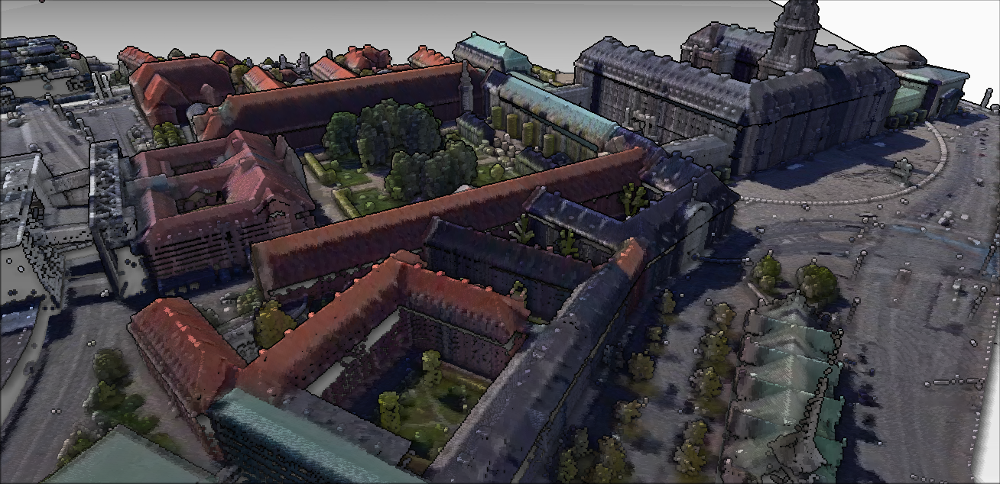

In [17]:
Image(filename = "../../QGIS/images/3d_render_validation_set.png", width=800, height=500)

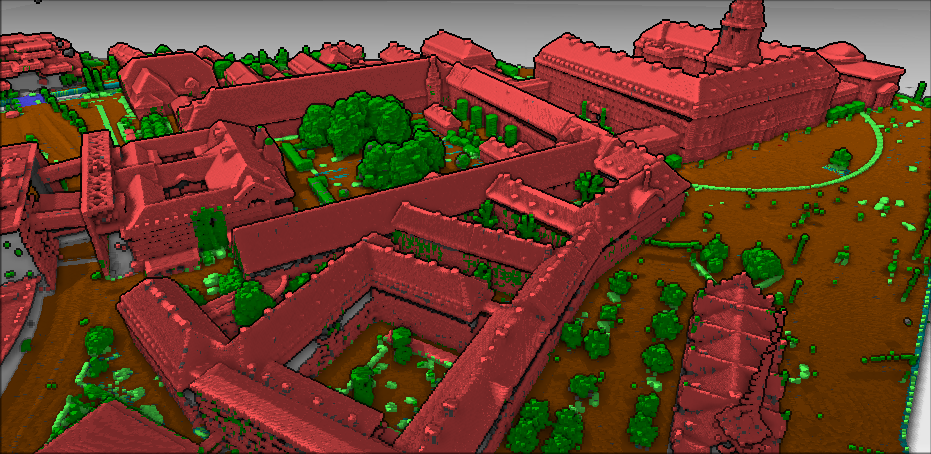

In [18]:
Image(filename = "../../QGIS/images/3d_classification_validation_set.png", width=800, height=500)

### Loading a new LiDAR dataset
Using the same features and labels as on the initial training dataset, the new data is loaded in.

In [19]:
val_dataset    = (data_folder + '/data/6175_725_KBH_color_jakted.laz')
las_val        = laspy.read(val_dataset)

point_data_val = np.stack([las_val.X, las_val.Y, las_val.Z, las_val.red, las_val.green, las_val.blue, las_val.intensity, las_val.classification, las_val.number_of_returns, las_val.omnivariance, las_val.planarity, las_val.verticality], axis = 0).transpose(1,0)
df_val         = pd.DataFrame(point_data_val, columns = ['X','Y','Z', 'R', 'G', 'B', 'Intensity', 'Classification', 'NumberOfReturns', 'Omnivariance', 'Planarity', 'Verticality'])
df_val         = df_val[df_val["Classification"].isin(classi_filt)]
val_pcd        = df_val
val_pcd.dropna(inplace=True)


### Checking the model performance on uncorrelated dataset

In [20]:
val_labels      = val_pcd['Classification']
val_features    = val_pcd[['X','Y','Z','R','G','B']]
val_predictions = rf_classifier.predict(val_features)
print(classification_report(val_labels, val_predictions, target_names = target_names_all))

                   precision    recall  f1-score   support

           Ground       0.94      0.73      0.82   6116245
Medium Vegetation       0.10      0.20      0.13    469504
  High Vegetation       0.29      0.87      0.43   1496004
        Buildings       0.96      0.46      0.62   4215010

         accuracy                           0.64  12296763
        macro avg       0.57      0.56      0.50  12296763
     weighted avg       0.83      0.64      0.68  12296763



### Initial Evaluation 
The model performance metrics from the new dataset indicate that there is a prediction problem. It is seen that we have a particularly low score on the vegetation predictions. This is more of an inner city area containing less patches of vegetation, but we still see street lamps and traffic lights classified as medium or high vegetation in the figure above.
By observing the 3 plots below, we can see that the model predicts vegetation instead of buildings, hence the low performance metrics, particularly the recall metrics of buildings

Text(0.5, 1.0, 'Differences')

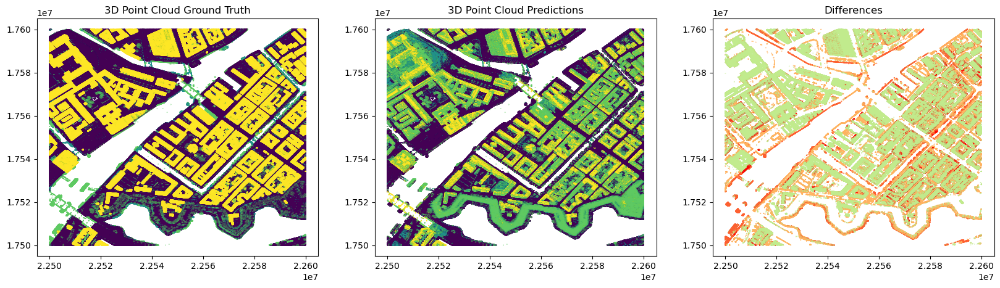

In [21]:
## Plotting
fig, axs = plt.subplots(1, 3, figsize = (20,5)) 
axs[0].scatter(val_features['X'], val_features['Y'], c = val_labels,      s = 0.05)
axs[0].set_title('3D Point Cloud Ground Truth')
axs[1].scatter(val_features['X'], val_features['Y'], c = val_predictions, s = 0.05)
axs[1].set_title('3D Point Cloud Predictions')
axs[2].scatter(val_features['X'], val_features['Y'], c = val_labels-val_predictions, cmap = plt.cm.rainbow, s = 0.05*(val_labels-val_predictions))
axs[2].set_title('Differences')

### Improving the models abilities
It is clear by now that the dataset has inherent issues with close-to-ground data. As stated previously and observed from the QGIS 3D images, the vegetation labels are often added to bridge decks, docks, piers and other types of infrastructure when it should not have been. 
In an attempt to improve the model, features will be added to the training and validation set and they will be scaled to see how it affects the prediction capabilities. 

In [22]:
## Adding features and scaling

## Training set
labels              = pcd['Classification']
features            = pcd[['Z','R','G','B','NumberOfReturns', 'Omnivariance', 'Planarity', 'Verticality']]
features_scaled     = MinMaxScaler().fit_transform(features)

## Validation set
val_labels          = val_pcd['Classification']
val_features        = val_pcd[['Z','R','G','B','NumberOfReturns', 'Omnivariance', 'Planarity', 'Verticality']]
val_features_scaled = MinMaxScaler().fit_transform(val_features)

X_train, X_test, y_train, y_test = train_test_split(features_scaled, labels, test_size=0.5)

rf_classifier  = RandomForestClassifier(n_estimators = 10)
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(n_estimators=10)

In [23]:
## Print result
print('Changing the features and introducing scaling for training data')
rf_predictions = rf_classifier.predict(X_test)
print(classification_report(y_test, rf_predictions, target_names = target_names_all))

print('Changing the features and introducing scaling validation data')
val_rf_predictions = rf_classifier.predict(val_features_scaled)
print(classification_report(val_labels, val_rf_predictions, target_names = target_names_all))


Changing the features and introducing scaling for training data
                   precision    recall  f1-score   support

           Ground       0.95      0.98      0.97   2467064
Medium Vegetation       0.64      0.56      0.60    254779
  High Vegetation       0.82      0.76      0.79    494492
        Buildings       0.95      0.95      0.95    923746

         accuracy                           0.92   4140081
        macro avg       0.84      0.81      0.82   4140081
     weighted avg       0.92      0.92      0.92   4140081

Changing the features and introducing scaling validation data
                   precision    recall  f1-score   support

           Ground       0.80      0.97      0.88   6116245
Medium Vegetation       0.04      0.09      0.06    469504
  High Vegetation       0.38      0.29      0.33   1496004
        Buildings       0.99      0.64      0.78   4215010

         accuracy                           0.74  12296763
        macro avg       0.55      0.50     

### Second evaluation
Comparing scores of the training data and the validation data before and after adding features and scaling them, shows that the model did not improve as desired. The training data is performing a little worse with a total accuracy loss of around 6 %. The validation data however have increased its total accuracy from 64 % to 74 %. Do note the low recall parameter on the buildings despite its high precision. By observing the plots below we can see that buildings are wrongfully predicited as vegetation still.

Text(0.5, 1.0, 'Differences')

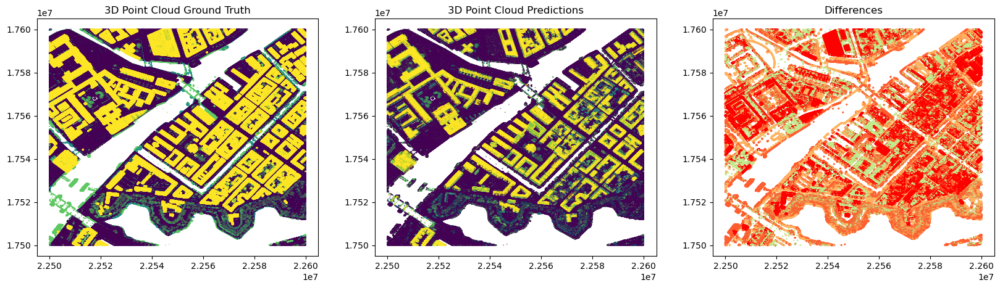

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(20,5))
axs[0].scatter(val_pcd['X'], val_pcd['Y'], c =val_labels, s=0.05)
axs[0].set_title('3D Point Cloud Ground Truth')
axs[1].scatter(val_pcd['X'], val_pcd['Y'], c = val_rf_predictions, s=0.05)
axs[1].set_title('3D Point Cloud Predictions')
axs[2].scatter(val_pcd['X'], val_pcd['Y'], c = val_labels-val_rf_predictions, cmap = plt.cm.rainbow, s=0.5*(val_labels-val_rf_predictions))
axs[2].set_title('Differences')

### Introduce data to the classifier
In order to beat the issues, small amounts of data from the validation set will be used to train the model (30%). The influx of some labelled data from the new dataset should help the model with its struggle due to the immense variation in the two different dataset and the noise included in the vegetation data.

In [25]:
val_labels      = val_pcd['Classification']
val_features    = val_pcd[['Z','R','G','B','NumberOfReturns', 'Omnivariance', 'Planarity', 'Verticality']]

## Using 30% of the new data for training and continue validating on 70 %
val_features_sampled, val_features_test, val_labels_sampled, val_labels_test = train_test_split(val_features, val_labels, test_size=0.7)
val_features_scaled_sample = MinMaxScaler().fit_transform(val_features_test)

labels          = pd.concat([pcd['Classification'],val_labels_sampled])
features        = pd.concat([pcd[['Z','R','G','B','NumberOfReturns',  'Omnivariance', 'Planarity', 'Verticality']],val_features_sampled])
features_scaled = MinMaxScaler().fit_transform(features)

## Using 30% of the validation data and 50% of the training data to train the model
X_train, X_test, y_train, y_test = train_test_split(features_scaled, labels, test_size = 0.5)
rf_classifier = RandomForestClassifier(n_estimators = 10)
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(n_estimators=10)

In [26]:
## Print result
## Same as above printed again (New features and scaled)
rf_predictions = rf_classifier.predict(X_test)
print(classification_report(y_test, rf_predictions, target_names = target_names_all))

## Result when using 10% of the validation data and testing on 90% of it
val_rf_predictions_90 = rf_classifier.predict(val_features_scaled_sample)
print(classification_report(val_labels_test, val_rf_predictions_90, target_names = target_names_all))

val_features_scaled = MinMaxScaler().fit_transform(val_features)
val_rf_predictions = rf_classifier.predict(val_features_scaled)
print(classification_report(val_labels, val_rf_predictions, target_names=target_names_all))

                   precision    recall  f1-score   support

           Ground       0.95      0.98      0.96   3384266
Medium Vegetation       0.61      0.50      0.55    325851
  High Vegetation       0.82      0.76      0.79    718978
        Buildings       0.95      0.95      0.95   1555500

         accuracy                           0.92   5984595
        macro avg       0.83      0.80      0.81   5984595
     weighted avg       0.91      0.92      0.92   5984595

                   precision    recall  f1-score   support

           Ground       0.92      0.90      0.91   4280641
Medium Vegetation       0.36      0.37      0.37    328250
  High Vegetation       0.60      0.72      0.65   1046890
        Buildings       0.96      0.92      0.94   2951954

         accuracy                           0.86   8607735
        macro avg       0.71      0.73      0.72   8607735
     weighted avg       0.87      0.86      0.87   8607735

                   precision    recall  f1-score  

### Third Evaluation
As seen in the metrics above, we have as expected improved the prediction result in the new data set by allowing the model to learn from features in the new data set. Generally across the 4 labels an improvement is noticed. The vegetation prediction has stabilized more, but still suffers from low scores. It is particularly visible in the plots below that the large structure in the north (red building), seems to be hard to predict. However, upon further examination of the data in QGIS, it became evident that it is infact the "ground truth" that is slightly misleading. Whilst it techincally can be said to be a building, it is a subsurface structure poking out a few meters above street level, with numerous trees and bushes on top. 

Text(0.5, 1.0, 'Differences')

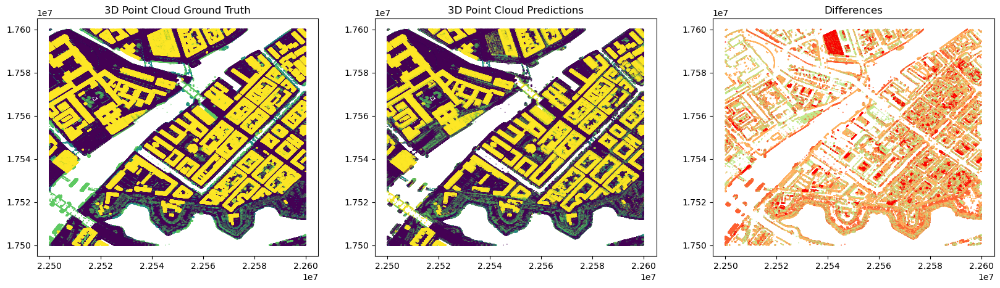

In [27]:
## Plotting improved model
fig, axs = plt.subplots(1, 3, figsize = (20,5))
axs[0].scatter(val_pcd['X'], val_pcd['Y'], c = val_pcd['Classification'], s = 0.05)
axs[0].set_title('3D Point Cloud Ground Truth')
axs[1].scatter(val_pcd['X'], val_pcd['Y'], c = val_rf_predictions,        s = 0.05)
axs[1].set_title('3D Point Cloud Predictions')
axs[2].scatter(val_pcd['X'], val_pcd['Y'], c = val_pcd['Classification']-val_rf_predictions, cmap = plt.cm.rainbow, s=0.05*(val_pcd['Classification']-val_rf_predictions))
axs[2].set_title('Differences')

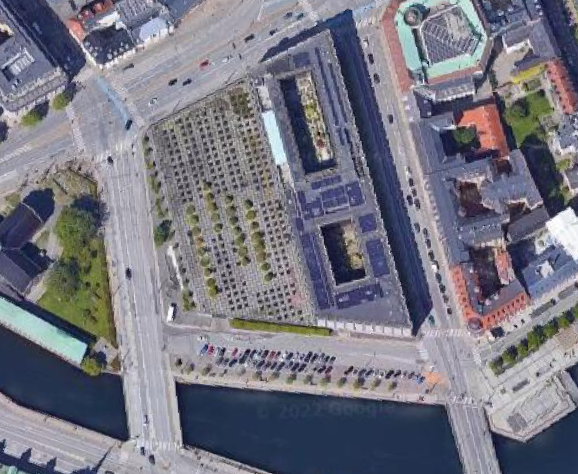

In [28]:
Image(filename = "../../QGIS/images/bygningflad.png", width=400, height=400)

In [29]:
## For saving the final model

val_pcd['predictions']=val_rf_predictions
val_pcd[['X','Y','Z','R','G','B','predictions']].to_csv(dmodel.split(".")[0]+"_result_final.xyz", index=None, sep=';')
pickle.dump(rf_classifier, open(data_folder+"/saved_models/urban_classifier.data", 'wb'))

## Summary and the label isue
Throughout this project and its several iterations of different combinations of input labels, the effect of the inherit mislabelling of the LiDAR data has become clear. 
By examing several different tiles from the Copenhagen area in QGIS, it is evident that the automatic labelling effort of the LiDar data from the data provider is not highly accurate. Street infrastructure such as lamp posts, traffic lights, bridge railings, low walls, house boats, docks and bathing piers are tagged with high vegetation or low vegetation labels. These labels are incoherent with the point cloud data locations. As an example it became evident that close to ground objects like boat docks and medium height objects such as houseboats are classified not only with the same label, but also in the wrong category. In this age of information abundance this is a common problem given the sheer quanity of data becoming available every day.  In order to make use of these vast amounts of data, a broad generalisation is the "best" current tool to somewhat distinguish features quickl and with some amount of accuracy. However at the cost of adding mislabelling to the data and therefore confusing the models prediction capabilities. Despite this, the Random Forest classifier performed relatively well once it was trained on a small amount of new data with a global accuracy of 87 %. 

Below I have added some further documentation as QGIS 3D pictures with the classification labels marked. The legend shows all labels for this area as seen on the first 3D view. Below is a picture showing only Ground, Medium vegetation and buildings. It clearly shows that low and high vegetation labels are added to piers, docks and street lamps. Whilst behind the high rise an area that consists of 2-floor housing units, marked as medium vegetation.

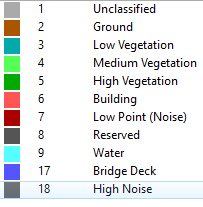

In [30]:
Image(filename = "../../QGIS/images/legend.png", width=200, height=300)

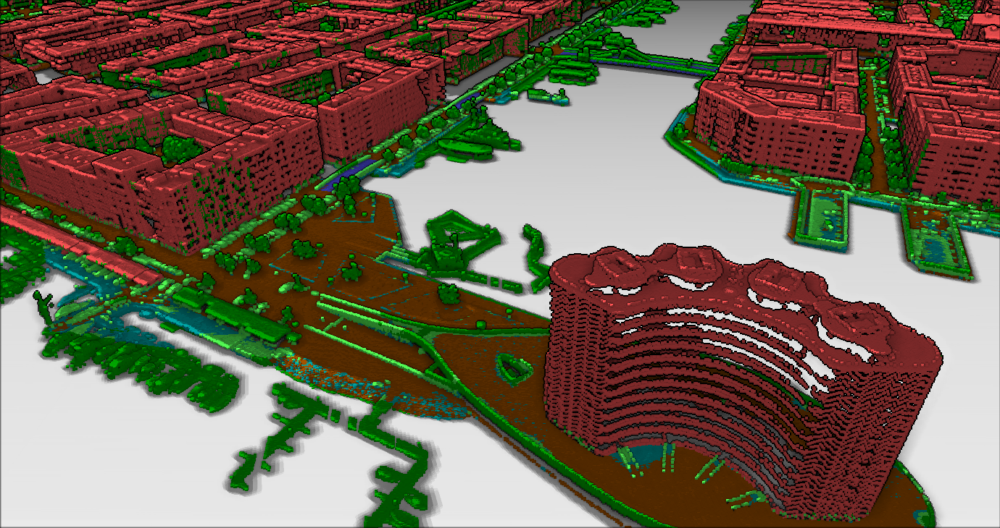

In [31]:
Image(filename = "../../QGIS/images/3d_sv_allvege.png", width=800, height=500)

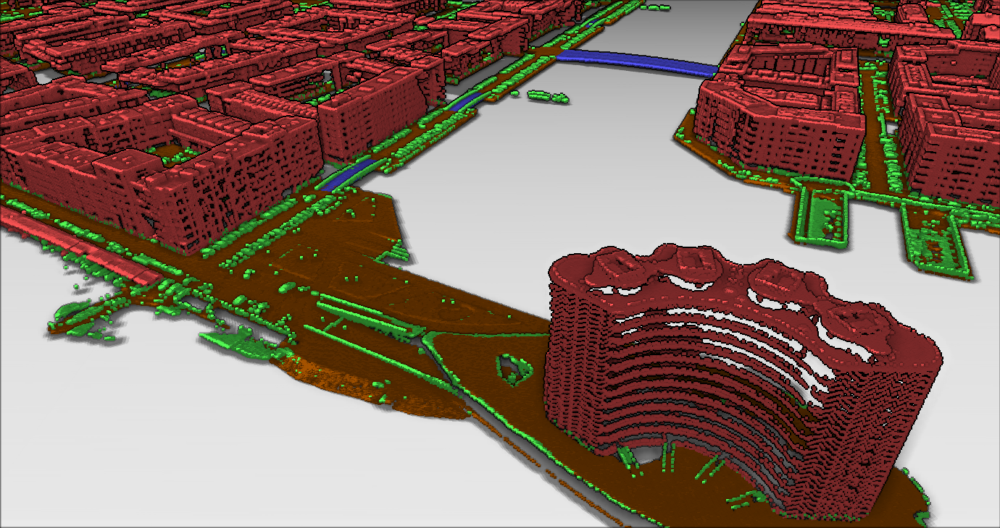

In [32]:
Image(filename = "../../QGIS/images/3d_sv_mediumvege.png", width=800, height=500)